# Seismic Preprocessing

Notebook testing composition and provenance configuration of a preprocessing workflow for synthetic and raw seismic waveform

## Input data preparation

Eeach key of the dictionary refers to the PE and contains the list (stream) of data passed on its input ports

In [22]:
%env MISFIT_PREP_CONFIG=processing.json 
%env STAGED_DATA=./

input_data = {
    "data": [
        {
            "input": {
                "data_dir": "./misfit_data/data",
                "synt_dir": "./misfit_data/synth",
                "events": "./misfit_data/events_simulation_CI_CI_test_0_1507128030823",
                "event_id": "smi:webservices.ingv.it/fdsnws/event/1/query?eventId=1744261",
                "stations_dir": "./misfit_data/stations",
                "output_dir" : "./misfit_data/output",
                "network": [
                    "IV"
                ],
                "station": [
		    "ARRO"
                ]
            }
        }
    ]
}



env: MISFIT_PREP_CONFIG=processing.json
env: STAGED_DATA=./


## Implementation of processing elements

The processing element can be developed within the notebook or imported from external modules (preprocessing_functions)


In [40]:
# Run:
# MISFIT_PREP_CONFIG="/Users/rosa/VERCE/dispy/dispel4py/test/seismo/misfit/processing.json" python -m dispel4py.new.processor simple dispel4py.test.seismo.misfit.create_misfit_prep -f /Users/rosa/VERCE/dispy/dispel4py/test/seismo/misfit/misfit_input.jsn
#
# Expects an environment variable MISFIT_PREP_CONFIG with the JSON file that specifies the preprocessing graph.

import json
import os
import sys

import preprocessing_functions as mf
from preprocessing_functions import get_event_time, get_synthetics, sync_cut, rotate_data
from dispel4py.provenance import *
from dispel4py.core import GenericPE
from seismo import SeismoSimpleFunctionPE, SeismoPE
from dispel4py.base import create_iterative_chain, ConsumerPE, IterativePE
from dispel4py.workflow_graph import WorkflowGraph
import dispel4py.new.simple_process as simple_process



class ReadDataPE(GenericPE):
    def __init__(self):
        GenericPE.__init__(self)
        self._add_input('input')
        self._add_output('output_real')
        self._add_output('output_synt')
        self.counter = 0

    def _process(self, inputs):
        params = inputs['input']
         
        stations = params['station']
        networks = params['network']
        data_dir = params['data_dir']
        synt_dir = params['synt_dir']
        event_file = params['events']
        event_id = params['event_id']
        stations_dir = params['stations_dir']
        output_dir = params['output_dir']
        fe = 'v'
        if self.output_units == 'velocity':
            fe = 'v'
        elif self.output_units == 'displacement':
            fe = 'd'
        elif self.output_units == 'acceleration':
            fe = 'a'
        else:
            self.log('Did not recognise output units: %s' % output_units)
        quakeml = event_file
        for i in range(len(stations)):
            station = stations[i]
            network = networks[i]
            data_file = os.path.join(data_dir, network + "." + station + ".." + '?H?.mseed')
            synt_file = os.path.join(synt_dir, network + "." + station + "." + '?X?.seed' + fe)
            ### in case we have the ascii synthetic traces, we have to comment the previous line, and uncomment the following one####### 
            #synt_file = os.path.join(synt_dir, network + "." + station + "." + '?X?.sem' + fe)
            sxml = os.path.join(stations_dir, network + "." + station + ".xml")
            real_stream, sta, event = mf.read_stream(data_file, sxml=sxml,
                                                  event_file=quakeml,
                                                  event_id=event_id)
            synt_stream = get_synthetics(synt_file, 
                                         get_event_time(quakeml, event_id), station, network)
            data, synt = sync_cut(real_stream, synt_stream)
            
            self.write(
                'output_real', [data, { 
                    'station' : sta, 
                    'event' : event, 
                    'stationxml' : sxml, 
                    'quakeml' : quakeml, 
                    'output_dir' : output_dir }
                ])
            self.write(
                'output_synt', [synt, {
                    'station' : sta, 
                    'event' : event, 
                    'stationxml' : sxml, 
                    'quakeml' : quakeml, 
                    'output_dir' : output_dir }
                ])

class RotationPE(IterativePE):
    def __init__(self, tag):
        IterativePE.__init__(self)
        self.tag = tag

    def _process(self, data):
        stream, metadata = data
        output_dir = metadata['output_dir']
        stations = metadata['station']
        event = metadata['event']
        stats = stream[0].stats
        filename = "%s.%s.%s.png" % (
            stats['network'], stats['station'], self.tag)
        #stream.plot(outfile=os.path.join(output_dir, filename))
        stream = rotate_data(stream, stations, event)
        filename = "rotate-%s.%s.%s.png" % (
            stats['network'], stats['station'], self.tag)
        #stream.plot(outfile=os.path.join(output_dir, filename))
        return (stream, metadata)


class StoreStream(ConsumerPE):
    def __init__(self, tag):
        ConsumerPE.__init__(self)
        self.tag = tag
        self._add_output('output')
        

    def _process(self, data):
        filelist = {}
        stream, metadata = data
        output_dir = metadata['output_dir']
        for i in range(len(stream)):
            stats = stream[i].stats
            filename = os.path.join(output_dir, "%s.%s.%s.%s" % (
                stats['network'], stats['station'], stats['channel'], self.tag))
            stream[i].write(filename, format='MSEED')
            #stream[i].write(filename, format='MSEED')
            filelist[stats['channel']] = filename
            self.write('output',stream,location=filename)


class MisfitPreprocessingFunctionPE(IterativePE):

    def __init__(self):
        IterativePE.__init__(self)

    def _process(self, data):
        stream, metadata = data
        result = self.compute_fn(stream, **self.params)
        
        if isinstance(result, dict) and '_d4p_prov' in result:
            if isinstance(self, (ProvenanceType)):
                result['_d4p_data']=result['_d4p_data'],metadata
                return result
            else:
                return result['_d4p_data'], metadata
        else:
            return result, metadata


def create_processing_chain(proc):
    processes = []
    for p in proc:
        fn_name = p['type']
        params = p['parameters']
        fn = getattr(mf, fn_name)
        processes.append((fn, params))
    return create_iterative_chain(processes, FunctionPE_class=MisfitPreprocessingFunctionPE)


## Workflow Composition

The workflow can be composed. 

The main processing chain structure and parameters can be imported by reading an external JSON file (environment variable MISFIT_PREP_CONFIG). 

The create_processing_chain function will automatically compose the pipelines

{'output_units': 'velocity', 'rotate_to_ZRT': True, 'data_processing': [{'type': 'detrend', 'parameters': {'method': 'linear'}}, {'type': 'taper', 'parameters': {'taper_type': 'hann', 'max_percentage': 0.05}}, {'type': 'remove_response', 'parameters': {'pre_filt': [0.005, 0.01, 8.0, 10.0], 'response_output': 'VEL'}}, {'type': 'filter_lowpass', 'parameters': {'frequency': 2.0, 'zerophase': False, 'corners': 3}}, {'type': 'plot_stream', 'parameters': {'output_dir': './', 'source': 'filter_lowpass', 'tag': 'rawdataplot'}}, {'type': 'filter_bandpass', 'parameters': {'min_frequency': 0.1, 'max_frequency': 2.0, 'zerophase': False, 'corners': 3}}], 'synthetics_processing': [{'type': 'detrend', 'parameters': {'method': 'linear'}}, {'type': 'taper', 'parameters': {'taper_type': 'hann', 'max_percentage': 0.05}}, {'type': 'pre_filter', 'parameters': {'pre_filt': [0.005, 0.01, 8.0, 10.0]}}, {'type': 'filter_lowpass', 'parameters': {'frequency': 2.0, 'zerophase': False, 'corners': 3}}, {'type': 'fi

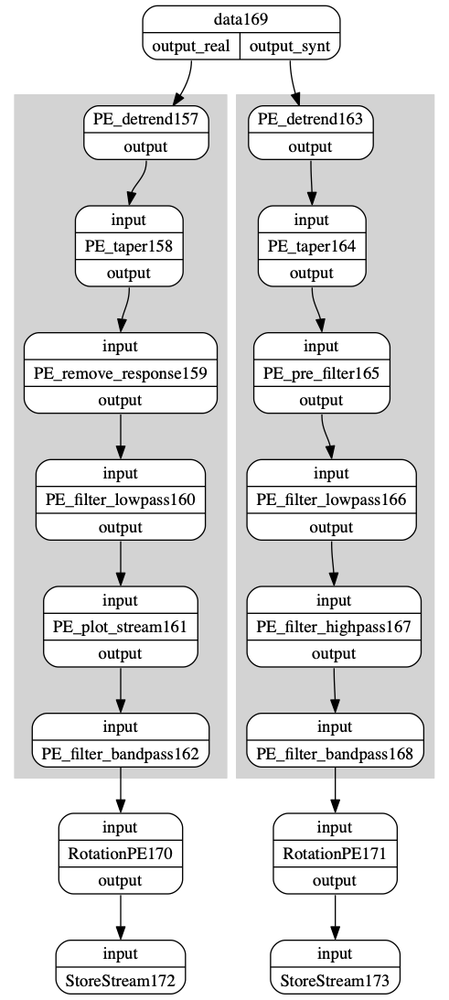

In [41]:
import preprocessing_functions as mf
from preprocessing_functions import get_event_time, get_synthetics, sync_cut, rotate_data

with open(os.environ['MISFIT_PREP_CONFIG']) as f:
    proc = json.load(f)
    print(proc)


    
def buildWorkflow():
    real_preprocess = create_processing_chain(proc['data_processing'])
    synt_preprocess = create_processing_chain(proc['synthetics_processing'])
    graph = WorkflowGraph()
    read = ReadDataPE()
    read.name = 'data'
    read.output_units = proc['output_units']
    rotate_real = RotationPE('data')
    rotate_synt = RotationPE('synth')
    store_real = StoreStream('data')
    store_synt = StoreStream('synth')
    graph.connect(read, 'output_real', real_preprocess, 'input')
    graph.connect(read, 'output_synt', synt_preprocess, 'input')
    if proc['rotate_to_ZRT']:
        graph.connect(real_preprocess, 'output', rotate_real, 'input')
        graph.connect(synt_preprocess, 'output', rotate_synt, 'input')
        graph.connect(rotate_real, 'output', store_real, 'input')
        graph.connect(rotate_synt, 'output', store_synt, 'input')
    else:
        graph.connect(real_preprocess, 'output', store_real, 'input')
        graph.connect(synt_preprocess, 'output', store_synt, 'input')
    
    return graph
    

graph=buildWorkflow() 

from dispel4py.visualisation import display
display(graph)

In [42]:
#!python -m dispel4py.new.processor simple create_misfit_prep.py -f misfit_input.jsn

## Execution without Provenance

In [43]:
def runExampleWorkflow(graph):
                                                     
                      
    graph.flatten()
    #Launch in simple process
    result = simple_process.process_and_return(graph, input_data)
    print("\n RESULT: "+str(result))

runExampleWorkflow(graph)

/anaconda3/lib/python3.7/site-packages/obspy/core/trace.py:2111: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(self.data.dtype, float):


13.5697 41.7143
13.5697 41.7143
SimplePE: Processed 1 iteration.

 RESULT: {'StoreStream172': {'output': [<obspy.core.stream.Stream object at 0x1c1d180208>, <obspy.core.stream.Stream object at 0x1c1d180208>, <obspy.core.stream.Stream object at 0x1c1d180208>]}, 'StoreStream173': {'output': [<obspy.core.stream.Stream object at 0x1c1b8dd668>, <obspy.core.stream.Stream object at 0x1c1b8dd668>, <obspy.core.stream.Stream object at 0x1c1b8dd668>]}}


/anaconda3/lib/python3.7/site-packages/obspy/io/mseed/core.py:772: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/anaconda3/lib/python3.7/site-packages/obspy/core/trace.py:2111: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(self.data.dtype, float):


## Provenance Storage

The provenance acquisition endpoints (API) are specified. Alternatively, the provenance document can be stored locally in the PROV_PATH 

In [44]:
#Store via service

#ProvenanceType.REPOS_URL='http://ec2-18-197-219-251.eu-central-1.compute.amazonaws.com/workflowexecutions/insert'
#ProvenanceType.PROV_EXPORT_URL='http://ec2-18-197-219-251.eu-central-1.compute.amazonaws.com/workflowexecutions/'



ProvenanceType.REPOS_URL='http://testbed.project-dare.eu/prov/workflowexecutions/insert'
ProvenanceType.PROV_EXPORT_URL='http://testbed.project-dare.eu/prov/workflowexecutions/'

#Store to local path
ProvenanceType.PROV_PATH='./prov-files/'

#Size of the provenance bulk before sent to storage or sensor
ProvenanceType.BULK_SIZE=1


## Provenance Configuration

The workflow can be configured to capture provenance and lineage information by populating a json dictionary, according to specific metadata and precision requirements.

- 's-prov:componentsType': assigns provenance types and clusters to the workflow element overriding defaults
- 's-prov:WFExecutionInputs': specifies the initial input data of the workflow. Anything relevant can be mentioned in a list of dictionaries

In [45]:
prov_config =  {
                    'provone:User': "aspinuso", 
                    's-prov:description' : "provdemo demokritos",
                    's-prov:workflowName': "demo_epos",
                    's-prov:workflowType': "seis:preprocess",
                    's-prov:workflowId'  : "workflow process",
                    's-prov:save-mode'   : 'service'         ,
                    's-prov:WFExecutionInputs':  [{
                        "url": "",
                        "mime-type": "text/json",
                        "name": "input_data"
                         
                     }],
                    # defines the Provenance Types and Provenance Clusters for the Workflow Components
                    's-prov:componentsType' : 
                                       {'PE_taper': {'s-prov:type':(SeismoPE,),
                                                     's-prov:prov-cluster':'seis:Processor'},
                                        'PE_filter_bandpass': {'s-prov:type':(SeismoPE,),
                                                     's-prov:prov-cluster':'seis:Processor'},
                                        'StoreStream':    {'s-prov:prov-cluster':'seis:DataHandler',
                                                           's-prov:type':(SeismoPE,)},
                                        },
                    's-prov:sel-rules': None
                } 

Once the provenance requirements are set, the graph is prepared for provenance recording

Change grouping implementation 
PE_detrend Original base class: (<class 'dispel4py.base.IterativePE'>,)
(<class 'dispel4py.provenance.ProvenanceType'>,)
 New type: (<class 'dispel4py.provenance.ProvenanceType'>, <class '__main__.MisfitPreprocessingFunctionPE'>)
PE_detrend Original base class: (<class 'dispel4py.base.IterativePE'>,)
(<class 'dispel4py.provenance.ProvenanceType'>,)
 New type: (<class 'dispel4py.provenance.ProvenanceType'>, <class '__main__.MisfitPreprocessingFunctionPE'>)
PE_filter_bandpass Original base class: (<class 'dispel4py.base.IterativePE'>,)
 New type: (<class 'seismo.SeismoPE'>, <class '__main__.MisfitPreprocessingFunctionPE'>)
PE_filter_bandpass Original base class: (<class 'dispel4py.base.IterativePE'>,)
 New type: (<class 'seismo.SeismoPE'>, <class '__main__.MisfitPreprocessingFunctionPE'>)
PE_filter_highpass Original base class: (<class 'dispel4py.base.IterativePE'>,)
(<class 'dispel4py.provenance.ProvenanceType'>,)
 New type: (<class 'dispel4py.provenance.

NewWorkflowRun191: Postprocess: (200, 'OK', b'{"inserts": [{"updatedExisting": false, "nModified": 0, "ok": 1.0, "upserted": "JUP_PREPOC_orfeus-as-10898-dc2cadc4-61ba-11e9-b0b2-f45c89acf865", "n": 1}], "success": true}')
SimplePE: Processed 1 iteration.
Outputs: {}


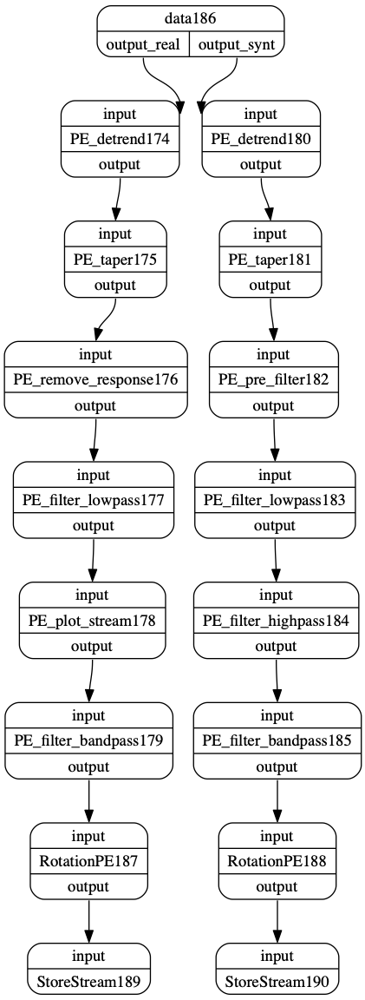

In [46]:
def createGraphWithProv():
    
    graph = buildWorkflow()
    # Ranomdly generated unique identifier for the current run
    rid='JUP_PREPOC_'+getUniqueId()

    
    # Finally, provenance enhanced graph is prepared:
    

     
    #Initialise provenance storage to service:
    configure_prov_run(graph, 
                     provImpClass=(ProvenanceType,),
                     input=prov_config['s-prov:WFExecutionInputs'],
                     username=prov_config['provone:User'],
                     runId=rid,
                     description=prov_config['s-prov:description'],
                     workflowName=prov_config['s-prov:workflowName'],
                     workflowType=prov_config['s-prov:workflowType'],
                     workflowId=prov_config['s-prov:workflowId'],
                     save_mode=prov_config['s-prov:save-mode'],
                     componentsType=prov_config['s-prov:componentsType'],
                     sel_rules=prov_config['s-prov:sel-rules']
                      
                    )
    
    return graph,rid


graph,rid=createGraphWithProv()

display(graph)

## Execution with Provenance

In [47]:
runExampleWorkflow(graph)


data186: BUILDING INITIAL DERIVATION
data186: {'content': [{}], 'id': 'orfeus-as-10898-e07ac0a0-61ba-11e9-b0b2-f45c89acf865', 'format': '', 'location': '', 'annotations': [], 'port': 'output_real', 'size': 1031}
data186: {'content': [{}], 'id': 'orfeus-as-10898-e07ae562-61ba-11e9-b0b2-f45c89acf865', 'format': '', 'location': '', 'annotations': [], 'port': 'output_synt', 'size': 1031}
PE_detrend174: <class 'dispel4py.base.IterativePE'>
PE_detrend174: {'content': [{}], 'id': 'orfeus-as-10898-e08e3ad6-61ba-11e9-b0b2-f45c89acf865', 'format': '', 'location': '', 'annotations': [], 'port': 'output', 'size': 1015}
PE_taper175: <class 'dispel4py.base.IterativePE'>
PE_taper175: {'content': [{'prov:type': 'waveform', 'id': 'e08eae6c-61ba-11e9-b0b2-f45c89acf865', 'sampling_rate': 100.0, 'delta': 0.01, 'starttime': '2013-02-16T21:16:09.240000Z', 'endtime': '2013-02-16T21:17:09.220000Z', 'npts': 5999.0, 'calib': 1.0, 'network': 'IV', 'station': 'ARRO', 'location': '', 'channel': 'EHE', 'mseed': {'d

/anaconda3/lib/python3.7/site-packages/obspy/core/trace.py:2111: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(self.data.dtype, float):


PE_plot_stream178: <class 'dispel4py.base.IterativePE'>
PE_plot_stream178: {'content': [{'prov:type': 'rawdataplot', 'station': 'ARRO', 'channel': 'EHE', 'network': 'IV'}], 'id': 'orfeus-as-10898-e0cb6d02-61ba-11e9-b0b2-f45c89acf865', 'format': 'image/png', 'location': 'file://orfeus-as/.//./filter_lowpass-IV.ARRO.EHE.rawdataplot.png', 'annotations': [], 'port': 'output', 'size': 1015}
PE_filter_bandpass179: <class 'dispel4py.base.IterativePE'>
PE_filter_bandpass179: {'content': [{'prov:type': 'waveform', 'id': 'e0cc9d30-61ba-11e9-b0b2-f45c89acf865', 'sampling_rate': 100.0, 'delta': 0.01, 'starttime': '2013-02-16T21:16:09.240000Z', 'endtime': '2013-02-16T21:17:09.220000Z', 'npts': 5999.0, 'calib': 1.0, 'network': 'IV', 'station': 'ARRO', 'location': '', 'channel': 'EHE', 'mseed': {'dataquality': 'D', 'number_of_records': 184.0, 'encoding': 'STEIM1', 'byteorder': '>', 'record_length': 512.0, 'filesize': 94208.0}, '_format': 'MSEED', 'response': 'Channel Response\n\tFrom M/S () to COUNTS

/anaconda3/lib/python3.7/site-packages/obspy/io/mseed/core.py:772: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


StoreStream189: {'content': [{'prov:type': 'waveform', 'id': 'e0f694e6-61ba-11e9-b0b2-f45c89acf865', 'sampling_rate': 100.0, 'delta': 0.01, 'starttime': '2013-02-16T21:16:09.240000Z', 'endtime': '2013-02-16T21:17:09.220000Z', 'npts': 5999.0, 'calib': 1.0, 'network': 'IV', 'station': 'ARRO', 'location': '', 'channel': 'EHT', 'mseed': {'dataquality': 'D', 'number_of_records': 184.0, 'encoding': 'STEIM1', 'byteorder': '>', 'record_length': 512.0, 'filesize': 94208.0}, '_format': 'MSEED', 'response': 'Channel Response\n\tFrom M/S () to COUNTS ()\n\tOverall Sensitivity: 5.03316e+08 defined at 1.000 Hz\n\t4 stages:\n\t\tStage 1: PolesZerosResponseStage from M/S to V, gain: 400\n\t\tStage 2: CoefficientsTypeResponseStage from V to COUNTS, gain: 1.25829e+06\n\t\tStage 3: CoefficientsTypeResponseStage from COUNTS to COUNTS, gain: 1\n\t\tStage 4: CoefficientsTypeResponseStage from COUNTS to COUNTS, gain: 1', 'processing': '["ObsPy 1.1.0: interpolate(args=()::method=\'cubic\'::npts=5999::sampling

/anaconda3/lib/python3.7/site-packages/obspy/core/trace.py:2111: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(self.data.dtype, float):


StoreStream190: {'content': [{'prov:type': 'waveform', 'id': 'e124a9c6-61ba-11e9-b0b2-f45c89acf865', 'sampling_rate': 100.0, 'delta': 0.01, 'starttime': '2013-02-16T21:16:09.240000Z', 'endtime': '2013-02-16T21:17:09.240000Z', 'npts': 6001.0, 'calib': 1.0, 'network': 'IV', 'station': 'ARRO', 'location': '', 'channel': 'HXT', 'mseed': {'dataquality': 'D', 'number_of_records': 12.0, 'encoding': 'FLOAT32', 'byteorder': '>', 'record_length': 4096.0, 'filesize': 49152.0}, '_format': 'MSEED', 'processing': '[\'ObsPy 1.1.0: decimate(factor=2::no_filter=True::strict_length=False)\', "ObsPy 1.1.0: interpolate(args=()::method=\'cubic\'::npts=5999::sampling_rate=100.0::starttime=UTCDateTime(2013, 2, 16, 21, 16, 9, 240000)::time_shift=0.0)", "ObsPy 1.1.0: detrend(options={}::type=\'linear\')", "ObsPy 1.1.0: taper(max_length=None::max_percentage=0.05::side=\'both\'::type=\'hann\')", "ObsPy 1.1.0: filter(options={\'freq\': 2.0, \'corners\': 3, \'zerophase\': False}::type=\'lowpass\')", "ObsPy 1.1.0: 

## Extract Provenance 

The complete workflow's run lineage can be extracted in different formats (xml|rdf)

In [14]:
import xml.etree.ElementTree as ET

print("Extract Trace for run: "+rid)
expurl = urlparse(ProvenanceType.PROV_EXPORT_URL)
connection = httplib.client.HTTPConnection(expurl.netloc)
url="http://"+expurl.netloc+expurl.path+rid+"/export?level=100&format=xml"

print(url)
connection.request(
                "GET", url)
response = connection.getresponse()
  
print("progress: " + str((response.status, response.reason)))
prov1 = ET.fromstring(response.read())
print('PROV TO EMBED:')
print(str(prov1))

Extract Trace for run: JUP_PREPOC_orfeus-as-10599-b273be8c-61b5-11e9-a859-f45c89acf865
http://testbed.project-dare.eu/prov/workflowexecutions/JUP_PREPOC_orfeus-as-10599-b273be8c-61b5-11e9-a859-f45c89acf865/export?level=100&format=xml
progress: (200, 'OK')
PROV TO EMBED:
<Element '{http://www.w3.org/ns/prov#}document' at 0x1c1cf92f48>


## Visualisation 

Once extracted, the provenance can be visualised in the notebook, 
Otherwise and more practical, would be to access it interactively in the sprovflow-viewer:

http://ec2-18-195-126-28.eu-central-1.compute.amazonaws.com/sprovflow-viewer/html/view.jsp

Entering the username will show a list of latest execution. Users can search and select which one to analyse.



In [15]:
import prov
from IPython.display import Image
import io
from prov.model import ProvDocument, ProvBundle, ProvException, first, Literal
from prov.dot import prov_to_dot

def provURLToPNG(xml,format):
     
    xml_doc = io.BytesIO(urllib.request.urlopen(xml).read())
    doc=ProvDocument.deserialize(xml_doc,format="xml")
    dot = prov_to_dot(doc)
    
    if format=="png":
        dot.write_png('PROV.png')
        return 'PROV.png' 
    if format=="svg":
        dot.write_svg('PROV.svg')
        return 'PROV.svg'
    
    


png_content=provURLToPNG(url,"png")

Image(png_content)
